# Beneath the abstraction

A fundamental characteristic of digital systems is that they operate using discrete-valued variables. This means that the information processed inside a digital circuit can only assume a finite set of values. However, **the physical world is not digital**. Real-world variables, such as the voltage on a wire, the angular position of a gear, or the level of fluid in a cylinder, are continuous quantities. They can, at least in principle, take on an infinite number of values within a certain range. 

We have already considered part of the problem of mapping the continous physical world onto discrete digital values when we discussed two fundamental processes: sampling and quantization. Sampling reduces a signal that varies continuously in time into a sequence of values at discrete instants, while quantization reduces an amplitude that could take infinitely many values into a finite set of representable levels. These steps are crucial when we digitize information coming from the outside world—for example, converting a sound wave or temperature measurement into digital data. However, now we have a more deeper issue to address. Even after we have sampled and quantized a signal, we still need to define **how the resulting discrete values are represented physically within a digital system**. 

Let us consider an example based on voltage signals, which are the most common way to represent information in electronic systems. Suppose we want to represent a binary signal A using the voltage on a wire. One simple convention could be:
- A = 0 when the voltage is 0V 
- A = 1 when the voltage is 5V

At first sight this might appear straightforward, but in practice, **no physical system is perfectly noise-free** or perfectly stable. Slight variations in voltage are inevitable due to manufacturing tolerances, electromagnetic interference, or fluctuations in power supply. For instance, if the voltage on the wire is 4.97V, we would still like the system to interpret this as A = 1. The question becomes more subtle when the measured voltage is farther away from the expected ideal values. For example, should 4.3V still be considered a logical 1? And what about values like 2.8V or 2.5V? These intermediate cases highlight the need for **design rules** that establish clear **thresholds** between logical 0 and logical 1, while at the same time providing enough **tolerance** to handle noise.

At this point, we also see why **transistors** are indispensable. A transistor is a device that acts as a controllable switch: depending on the input voltage, it either allows or blocks the flow of current. By defining precise voltage thresholds, transistors turn the continuous world of voltages into the binary world of logic. Entire digital systems (processors, memories, and communication circuits) are built from billions of these tiny devices, each faithfully converting continuous electrical signals into the discrete values required by digital abstraction.

This process of defining how a continuous physical signal is interpreted as a discrete logical variable is at the very heart of digital design. Without it, the abstraction of 0 and 1 would collapse under the imperfections of the physical world.

## Logic Levels and Noise Margins

The lowest voltage in a digital circuit is typically 0V, called **ground** or **GND**. The highest voltage comes from the power supply and is denoted as **$V_{DD}$**. A binary signal is thus expected to swing between these two reference points. But as we have seen, real circuits are never perfect: voltages will never be exactly 0V or exactly $V_{DD}$. Manufacturing tolerances, temperature, and electrical noise all contribute to **variations**. 

### Logic levels
To ensure reliable operation, we introduce **voltage thresholds** that formally define what counts as a logical 0 or a logical 1:
-  $V_{OL}$: the maximum voltage that an output still considered a valid logic 0 can produce
-  $V_{OH}$: the minimum voltage that an output still considered a valid logic 1 can produce
-  $V_{IL}$: the maximum voltage that an input will still interpret as logic 0
-  $V_{IH}$: the minimum voltage that an input will interpret as logic 1

The following diagram illustrates this process: a driver generates an output signal that may vary within the ranges defined by $V_{OL}$ and $V_{OH}$. This signal is then received as an input, which has its own acceptable ranges defined by $V_{IL}$ and $V_{IH}$. The overlap between these definitions creates the s**afety margins** that make digital circuits reliable even in the presence of noise:

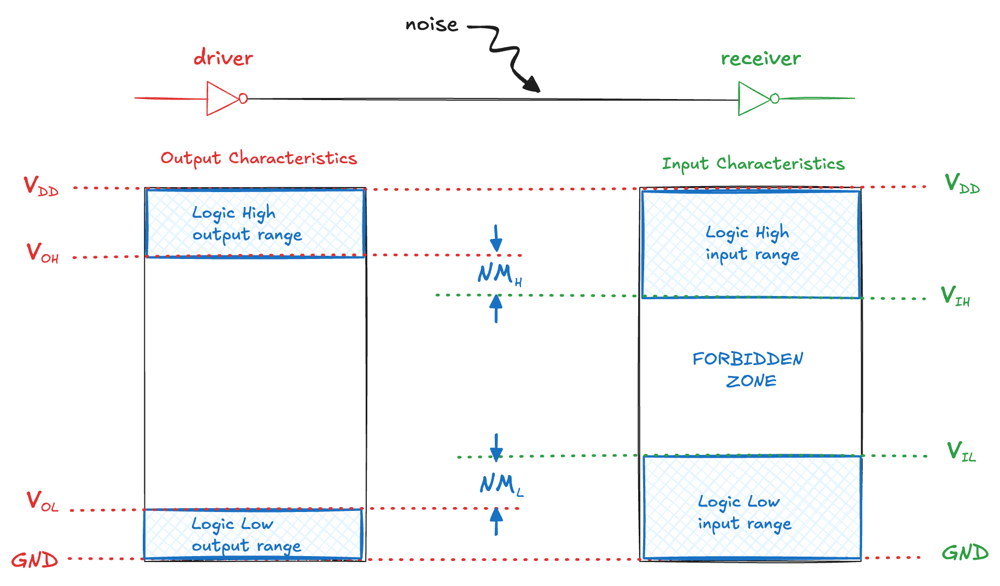

### Noise Margins

The **low noise margin** is

$NM_L = V_{IL} - V_{OL}$

representing how much noise can be added to a logic 0 signal without the risk of it being seen as a 1

The **high noise margin** is 

$NM_H = V_{OH} - V_{IH}$

representing how much noise can be added to a logic 1 signal without it being mistaken for a 0.

Between $V_{IL}$ and $V_{IH}$ lies a **forbidden zone**, where the circuit’s behavior is undefined. A voltage in this range cannot be reliably classified as either a 0 or a 1.

Defining logic levels and noise margins ensures that digital circuits are **robust against real-world imperfections**. This allows billions of transistors to communicate reliably, even though each one operates in an imperfect analog world. Without noise margins, every small fluctuation in voltage could lead to errors.

To better understand how noise margins guarantee the robustness of digital circuits, let us work through a concrete example. Consider the circuit: the output voltage of the first inverter is connected to the input voltage of the second inverter. Between them, we assume that some noise may be added to the signal, disturbing the transmission. Both inverters are characterized by the following voltage levels:
- Power supply: $V_{DD} = 5V$
- Input thresholds: $V_{IL} = 1.35V$, $V_{IH} = 3.15V$
- Output levels: $V_{OL} = 0.33V$, $V_{OH} = 3.84V$

With these values, we can compute the noise margins. The low noise margin is:

$NM_L = V_{IL} - V_{OL} = 1.35V - 0.33V = 1.02V$

This means that if the circuit outputs a logic 0, it can tolerate up to 1.02V of noise before the signal risks being misinterpreted as logic 1.

The high noise margin is:

$NM_H = V_{OH} - V_{IH} = 3.84V - 3.15V = 0.69V$

This means that when the circuit outputs a logic 1, it can tolerate up to 0.69V of noise before being mistaken for logic 0.

Now suppose that 1 V of noise is injected between the two inverters. When the output is LOW, the circuit can tolerate it, since NM_L = 1.02V > 1V, however when the output is HIGH, the circuit cannot tolerate it, since NM_H = 0.69V < 1V.

This example demonstrates how the robustness of a digital circuit depends on the size of the noise margins. A well-designed technology ensures that both NM_L and NM_H are **sufficiently large to guarantee reliable communication between gates, even in the presence of disturbances**.

### DC Transfer Characteristics

In the previous discussion, we saw that reliable digital systems require us to define logic levels: specific voltage ranges that represent 0 and 1. But where do these values come from? **How do we decide the boundaries between logic low and logic high?** To answer this, we must **look beneath the digital abstraction** and **examine the analog behavior of a gate**. Even though we think of gates as purely digital devices, in reality their operation is governed by continuous voltages and currents. The tool we use to describe this behavior is the **DC transfer characteristic**, which shows how the output voltage of a gate depends on its input voltage when the input is varied slowly. We can consider an ideal and a real inverter:

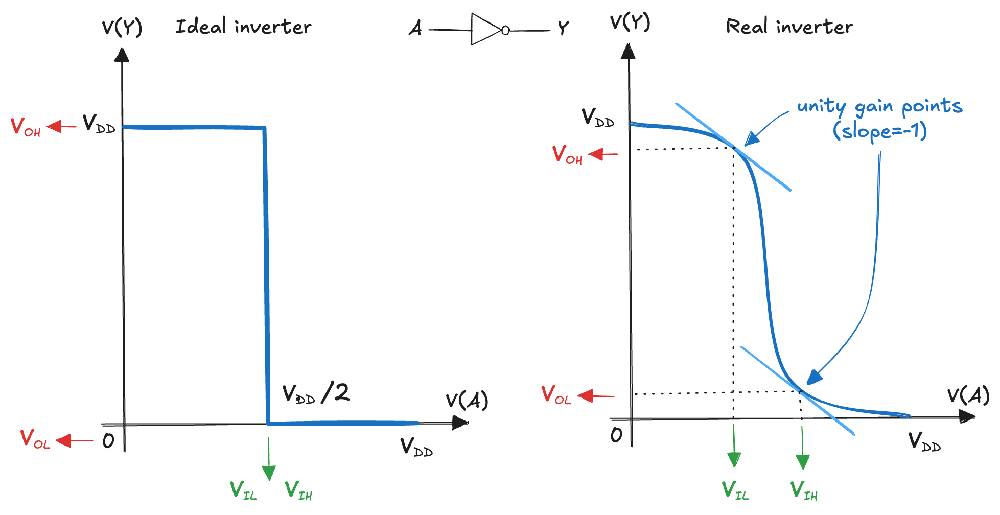

If digital abstraction were perfect, an inverter would behave like an **ideal switch**. Its output $V(Y)$ would remain at $V_{DD}$ (logic 1) for all input voltages V(A) below $V_{DD}/2$, and would abruptly jump to 0V (logic 0) as soon as the input exceeded $V_{DD}/2$. In this case:

$V_{IL} = V_{IH} = \tfrac{V_{DD}}{2}, \quad V_{OH} = V_{DD}, \quad V_{OL} = 0$

The digital abstraction would be exact: below the threshold the signal is a 0, above it the signal is a 1. Real circuits, however, **do not switch instantaneously**. The output of a physical inverter decreases gradually as the input increases:
- when $V(A) = 0$, the output is close to $V_{DD}$
- when $V(A) = V_{DD}$, the output is close to $0$
- in between, the transition is **smooth rather than abrupt** 

This gradual slope forces us to define more carefully where the boundary between logic 0 and logic 1 lies. The standard approach is to examine the slope of the transfer characteristic. The **critical points** are where the slope start to steepen significantly:

$\displaystyle \frac{dV(Y)}{dV(A)} = -1$

These **unity-gain points** define the thresholds:
- for $V(A) < V_{IL}$, the output is guaranteed to be a valid logic 1 (near $V_{OH}$)
- for $V(A) > V_{IH}$, the output is guaranteed to be a valid logic 0 (near $V_{OL}$)
- between $V_{IL}$ and $V_{IH}$, the output is undefined, this is the forbidden zone.

Defining logic levels in this way usually maximizes the noise margins, ensuring that the digital system remains reliable despite noise and imperfections.

### Logic Families

At this point, we have seen that logic levels must be carefully defined, and that noise margins provide robustness against imperfections. But there is a deeper design principle that ensures the entire digital system functions reliably: the **static discipline**. It states that **if a circuit element is given logically valid inputs, it must always produce logically valid outputs**. In other words, as long as the inputs fall within the acceptable ranges for logic 0 or logic 1, the output will also fall into the valid ranges. This guarantee allows us to build complex digital systems from simple components without worrying about the analog details of every transistor or wire.

We can think of the static discipline as a kind of **grammar for digital circuits**. Just as a language has rules of grammar that ensure words combine to form meaningful sentences, the static discipline ensures that gates, when connected correctly, produce valid digital behavior:
- if each "word" (gate) follows the rules, then every "sentence" (the overall circuit) will make sense	
- if a "word" violates the rules, the sentence becomes meaningless, just as a gate producing an invalid output voltage can corrupt the whole digital system.

This analogy helps us see why the static discipline is so powerful: it provides a framework that guarantees consistency, enabling complexity to be managed and systems to scale. Adopting the static discipline does mean **sacrificing some freedom**. We cannot arbitrarily connect any analog circuit and expect it to behave digitally. But this restriction is what gives digital design its **simplicity** and **robustness**:
- it allows engineers to ignore the continuous voltages and currents at the transistor level and instead reason in terms of abstract 0 and 1
- it raises the level of abstraction: from analog electronics to digital logic, where complexity is managed by hiding needless detail
- it ensures that as signals propagate through billions of gates, they remain unambiguous digital values.

Without the static discipline, noise would accumulate, thresholds would drift, and eventually the digital abstraction would collapse. One important consequence is that gates that communicate with each other **must use compatible logic levels**. The actual choice of supply voltage and thresholds is arbitrary, but **consistency is essential**.

For this reason, logic gates are grouped into **logic families**, from the 1970s through the 1990s, four major logic families dominated digital circuit design:

| Logic Family | $V_{DD}$          | $V_{IL}$   | $V_{IH}$   | $V_{OL}$   | $V_{OH}$   |
|--------------|-------------------|------------|------------|------------|------------|
| **TTL**      | 5 (4.75–5.25)     | 0.8        | 2.0        | 0.4        | 2.4        |
| **CMOS**     | 5 (4.5–6)         | 1.35       | 3.15       | 0.33       | 3.84       |
| **LVTTL**    | 3.3 (3–3.6)       | 0.8        | 2.0        | 0.4        | 2.4        |
| **LVCMOS**   | 3.3 (3–3.6)       | 0.9        | 1.8        | 0.36       | 2.7        |

Each family is **internally consistent**: any gate in the family can drive any other gate in the same family while obeying the static discipline. Second, families differ in their supply voltages and thresholds, which can create **compatibility issues** when mixing technologies:

| Driver     | Receiver: TTL | Receiver: CMOS         | Receiver: LVTTL | Receiver: LVCMOS |
|------------|---------------|------------------------|-----------------|------------------|
| **TTL**    | OK            | NO: $V_{OH} < V_{IH}$  | MAYBE           | MAYBE            |
| **CMOS**   | OK            | OK                     | MAYBE           | MAYBE            |
| **LVTTL**  | OK            | NO: $V_{OH} < V_{IH}$  | OK              | OK               |
| **LVCMOS** | OK            | NO: $V_{OH} < V_{IH}$  | OK              | OK               |

For example, TTL cannot reliably drive CMOS, because its guaranteed high output voltage is lower than the minimum high input voltage required by CMOS. In other cases, the answer is "maybe" because the margin is small and depends on manufacturing variations and operating conditions.

This shows why logic families are so important: they ensure that, within a family, **gates “snap together” like Lego bricks**, but crossing between families requires caution or additional interfacing circuits.

As technology progressed, a proliferation of logic families with **lower supply voltages** appeared. Moving from 5V to 3.3V, and then to 2.5V, 1.8V, and below, was driven by the need for **lower power consumption**. Each reduction in supply voltage requires a careful redefinition of logic levels and noise margins, but the static discipline ensures that digital abstraction remains intact.

## Implementing Logic Gates

At this point we understand that at the heart of digital system lie logic gates. These simple building blocks, capable of performing basic logical operations can be combined to form adders, memory elements, processors, and all the digital circuits we can imagine. However, a **logic gate is an abstraction**: it takes one or more binary inputs and produces a binary output. Yet, to become real, it must be **embodied in some physical device** capable of switching between two distinct states. A fundamental question arises: **how can we physically implement a logic gate?**

### Gears and vacuum tubes

The history of computing is, in large part, the story of how engineers and scientists have found different ways to realize this abstraction. The earliest serious attempt was Charles Babbage’s Analytical Engine in the 19th century. In this machine, **gears and levers** were used to represent logical states and perform operations. The approach worked in principle, but the machines were massive, complex, and slow. **Mechanical computation demonstrated feasibility but not practicality**. In the early 20th century, computation entered the electrical era with the use of **vacuum tubes**. A vacuum tube could act as an electronic switch: depending on the applied voltage, it would allow or block current flow:

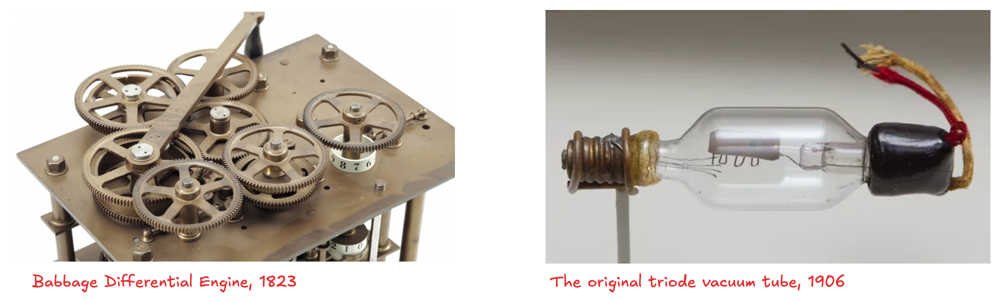

This property enabled the construction of the first electronic computers. Machines such as the IBM 701 (1952) contained **thousands of tubes** and could process thousands of words of data at unprecedented speeds compared to mechanical engines:

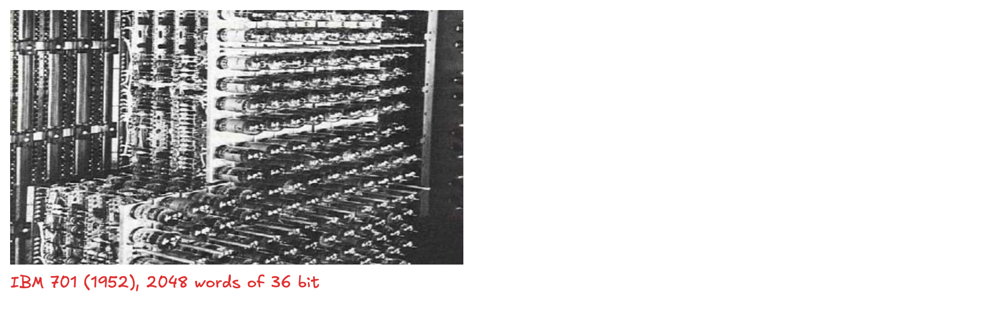

However, vacuum tubes came with **severe limitations**. They were large, fragile, power-hungry, and unreliable, producing significant heat and often burning out after only a few thousand hours of operation. Entire rooms were required to house tube-based computers, and frequent maintenance was necessary.

Thus, from the very beginning, the central problem in building digital systems has been finding a physical technology that can implement gates **efficiently**, **reliably**, and **at scale**. Mechanical gears were too slow, and vacuum tubes were too bulky and unreliable. The solution came in 1947 with the invention of the transistor, a device that would revolutionize electronics by offering a small, robust, and energy-efficient switch: the perfect foundation for digital logic. Yet the true **revolution** came not from the transistor alone, but from the ability to **integrate** large numbers of transistors onto a single chip of silicon. This breakthrough, known as the **integrated circuit (IC)**, transformed electronics by making it possible to build complex digital systems that were compact, fast, and affordable.

### Integrated Circuits

The origins of the integrated circuit trace back to two independent inventions at the end of the 1950s. In 1958, Jack Kilby at Texas Instruments demonstrated the first working integrated circuit, in which multiple components were fabricated together on a single piece of semiconductor material. In 1959, Robert Noyce at **Fairchild Semiconductor** went further, patenting a practical method for interconnecting many transistors on a single silicon chip. Noyce’s contribution solved the critical issue of wiring and scalability, laying the foundation for modern microelectronics:

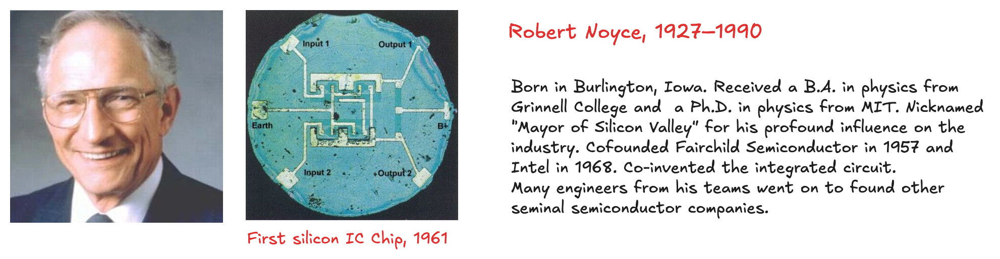

The impact was dramatic. In the 1950s, a single transistor could cost around 10 dollars, and building a system with thousands of them was prohibitively expensive. Today, decades of technological progress allow us to place over one billion transistors on a chip as small as 1cm2, with the effective cost of each transistor dropping below 10 micro-cents. This **extraordinary increase in density and decrease in cost** has been the engine driving the entire digital revolution.

The invention of the integrated circuit opened the door to unprecedented growth in computing power. But how fast could this growth continue? In 1965, Gordon Moore, cofounder of Intel, made a striking observation: **the number of transistors on an integrated circuit was doubling roughly every year**. A decade later, the rate was refined to a doubling about every two years. This empirical observation became known as **Moore’s Law**. It is not a law of physics, but rather an engineering and economic trend. It captures the fact that advances in manufacturing, materials, and design techniques have consistently enabled the semiconductor industry to shrink transistor sizes, allowing more and more devices to be placed on the same area of silicon. The following graph illustrates this phenomenon: from the early 1970s to the present, the number of transistors on microchips has increased from a few thousand to tens of billions, following a remarkably steady exponential trajectory. Each point represents a commercial microprocessor, showing how the trend has held for over five decades:

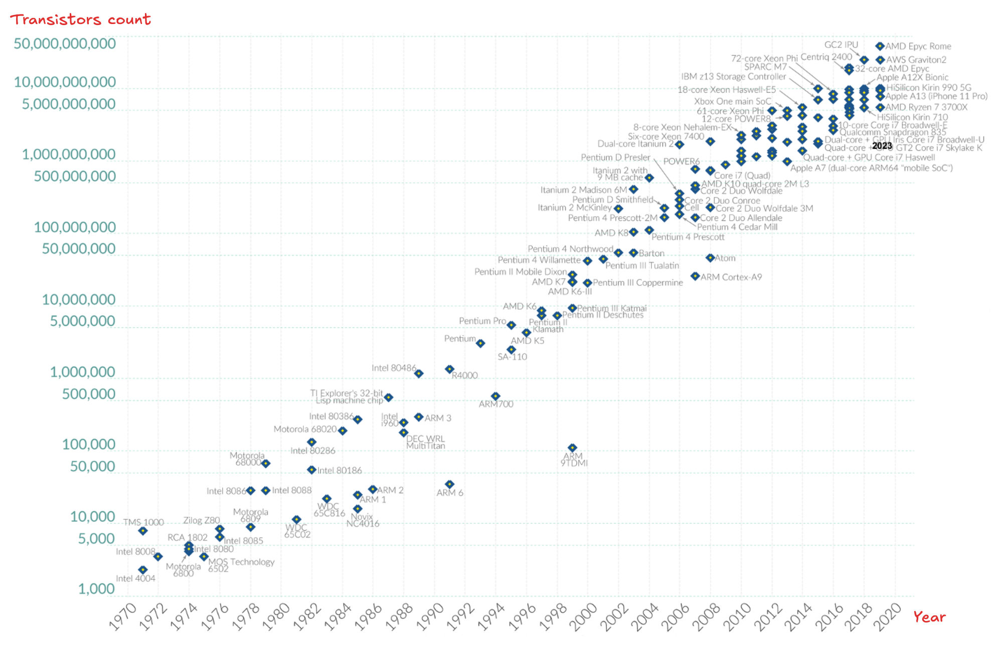

One of the most visible consequences of Moore’s Law has been the **steady shrinking of transistor dimensions**. The figure shows the characteristic minimum feature size (often referred to as the "process node") plotted against time:

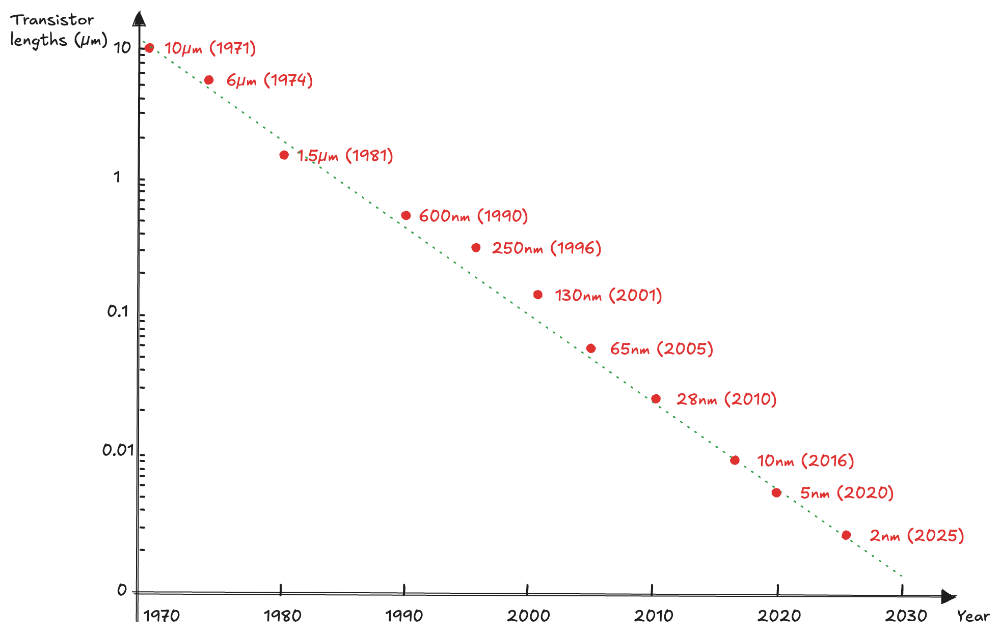

Each new generation of technology is defined by the length of the transistor (more specifically, its "gate length"), measured in micrometers (µm) or nanometers (nm). In the early 1970s, commercial microchips used processes with feature sizes of around 10µm. By the mid-1980s, scaling had already reduced this dimension below 1µm. The trend continued through the 1990s and 2000s, reaching 250nm (1996), 130nm (2001), and 65nm (2005). More recent generations have pushed into the deep nanometer regime, with 28nm (2010), 10nm (2016), 5nm (2020), and the current development of 2nm nodes or less in 2025.

The consequences have been revolutionary. As transistor counts increased, so did processing speed, memory capacity, and overall performance, while the cost per transistor decreased dramatically. This **exponential growth fueled the information age**, making possible everything from personal computers and smartphones to large-scale data centers. In the last decade, however, **the pace of scaling has slowed** since some **challenges have emerged**. As transistor dimensions approach the atomic scale, engineers face **fundamental physical barriers**, including: quantum effects, heat dissipation, manufacturing challenges, and material limits. Because of these factors, the continuous scaling that characterized Moore’s Law for decades is now slowing down. 

How can the industry continue to improve performance when scaling alone is no longer enough? The answer lies in moving "**Beyond Moore**": instead of relying solely on smaller transistors, engineers are exploring new strategies for extending computing capability.

One response has been to place **multiple processors** on a single chip. Instead of making one processor faster, manufacturers create multi-core processors that divide tasks across several cores. This approach has allowed performance to keep improving, even as clock speeds plateaued due to power and heat constraints. 

Another innovation is **3D integration**, where circuits are stacked vertically rather than spread out only in two dimensions. This reduces communication delays between components and increases density without requiring further shrinking of individual transistors.

Looking further ahead, researchers are exploring alternative devices and architectures: **new materials** such as graphene, carbon nanotubes, and 2D semiconductors promise faster switching and lower power; **specialized accelerators**, like GPUs and AI chips, achieve massive gains in performance for particular tasks; and **quantum computing** aims to go beyond classical logic, exploiting entirely new principles of information processing.


## Electron Devices

Digital systems are built upon a small set of fundamental building blocks known as **electron devices**. These are components specifically engineered to control the flow of electric charge through materials. Unlike passive elements such as resistors or capacitors, electron devices exploit the properties of semiconductors to actively switch, amplify, and process signals.

### Semiconductors

Modern transistors are built from **MOS (Metal-Oxide-Semiconductor) technology**, and the key material used is **silicon (Si)**. Silicon is so widely adopted because of its unique electronic properties. A silicon atom has a nucleus containing 14 protons and typically 14 neutrons, with 14 electrons orbiting the nucleus in shells. Its electron configuration is:

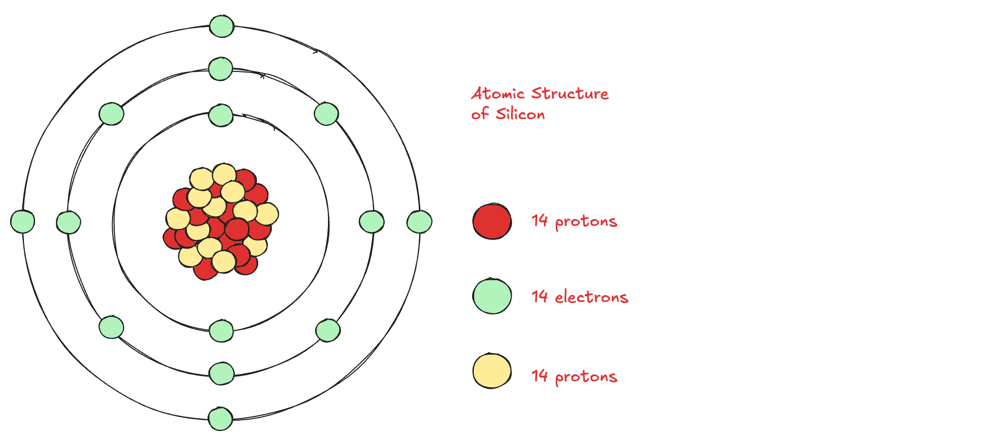

The outermost four electrons, known as **valence electrons**, play a crucial role in chemical bonding. In a crystal structure, each silicon atom forms four covalent bonds with neighboring atoms in a producing a very stable and regular structure, creating a rigid and strong lattice similar to that of diamond:

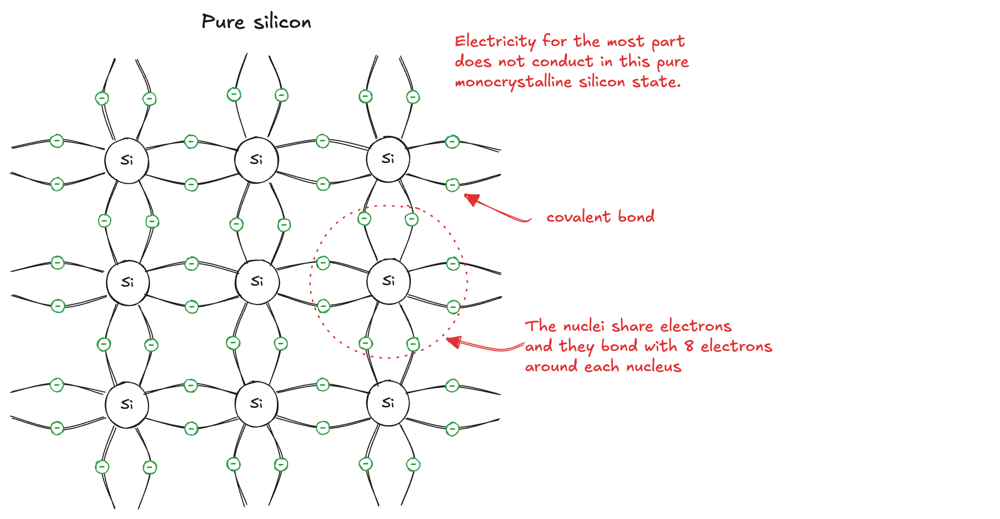

In this pure form, silicon is actually a **poor conductor**: all the electrons are locked into covalent bonds, leaving no free carriers to conduct electricity.

The magic of **semiconductors** lies in the ability to **tune their conductivity** by adding very small amounts of impurities, called **dopants**. Depending on the dopant, silicon can be made to conduct via two different mechanisms:
- **n-type doping**: if a dopant atom like arsenic (As) is introduced, it brings **five valence electrons** instead of four. Four of them bond with neighbors, but the extra electron remains free. This **free electron** can move through the lattice, carrying a negative charge. 
- **p-type doping**: if a dopant atom like boron (B) is used, it brings only **three valence electrons**. One bond in the lattice is left incomplete, creating a vacancy called a **hole**. An electron from a neighboring atom can move to fill this gap, leaving another hole behind. To the outside observer, it appears as though **the hole itself moves**. Since a hole represents the absence of a negative charge, it behaves like a positively charged particle.

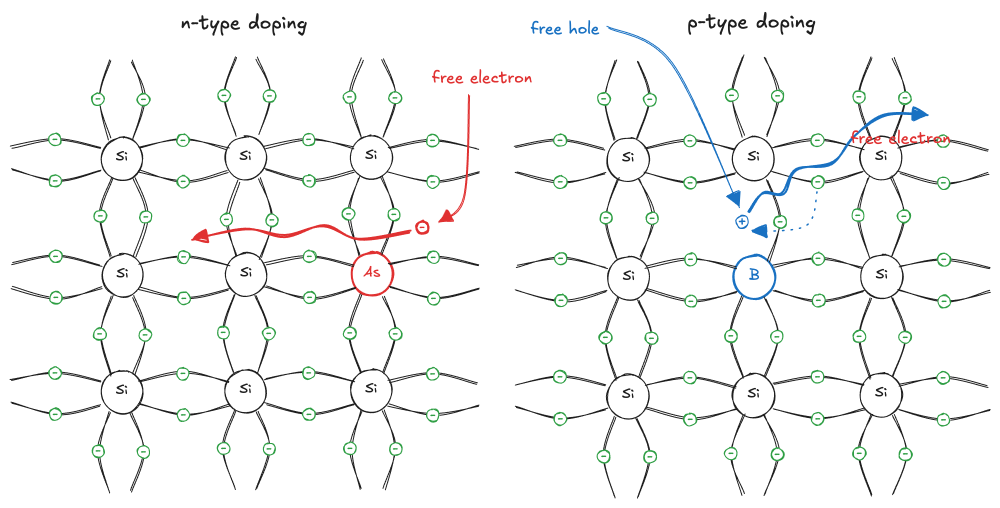

The key property of silicon is that its conductivity can be varied over many orders of magnitude simply by adjusting the concentration of dopants. This flexibility is what makes silicon neither a perfect conductor like copper, nor a perfect insulator like glass, but something in between: a **semiconductor**. This tunable behavior is what allows us to construct the fundamental devices of digital electronics: diodes and transistors.

## The p-n junction

A p–n junction is the **fundamental building block** of all semiconductor devices. It is formed by placing a region of p-type semiconductor in direct contact with a region of n-type semiconductor. The boundary between the two regions is called the **junction**:

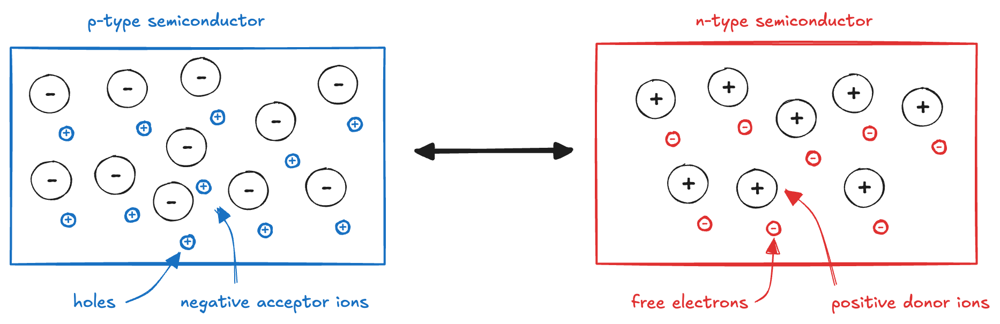

The p-type semiconductor contains **mobile holes as majority carriers**, balanced by an equal number of **immobile negatively charged acceptor ions**. Similarly, the n-type semiconductor contains **free electrons as majority carriers**, balanced by an equal number of **immobile positively charged donor ions**. In each region, the mobile carriers are **uniformly distributed** throughout the material, and overall electrical neutrality is maintained because the number of positive and negative charges is equal. When a p–n junction is formed, **charge carriers begin to diffuse across the boundary**. Holes from the p-type side migrate into the n-type side, while electrons from the n-type side migrate into the p-type side. This diffusion occurs because of a **concentration gradient**: the density of holes is higher on the p-side than on the n-side, and the density of electrons is higher on the n-side than on the p-side:

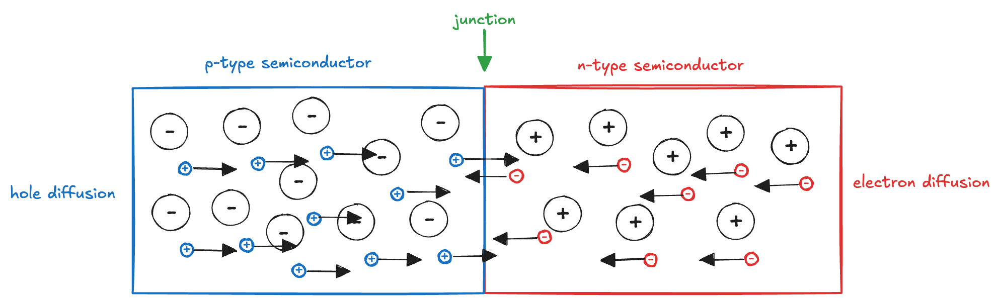

This process is called **diffusion**. As free electrons cross from the n-side into the p-side, they **recombine with holes**. In doing so, they **leave behind positively charged donor ions** (atoms that now have one fewer electron than protons) fixed in the crystal lattice on the n-side. At the same time, the electrons that enter the p-side create **negatively charged acceptor ions** (atoms that now have one more electron than protons). As a result, a region near the junction becomes filled with fixed positive ions on the n-side and fixed negative ions on the p-side. This region is called the **depletion region**, because it is depleted of mobile carriers. The fixed charges create an **internal electric field**: the p-side becomes negative, and the n-side becomes positive. This electric field **opposes further diffusion of charge carriers** across the junction. In other words, the initial diffusion sets up a barrier potential (also called the **built-in potential**) that prevents additional electrons from crossing from n to p and additional holes from crossing from p to n. For a silicon junction, the barrier potential is typically about 0.7 V under equilibrium conditions.

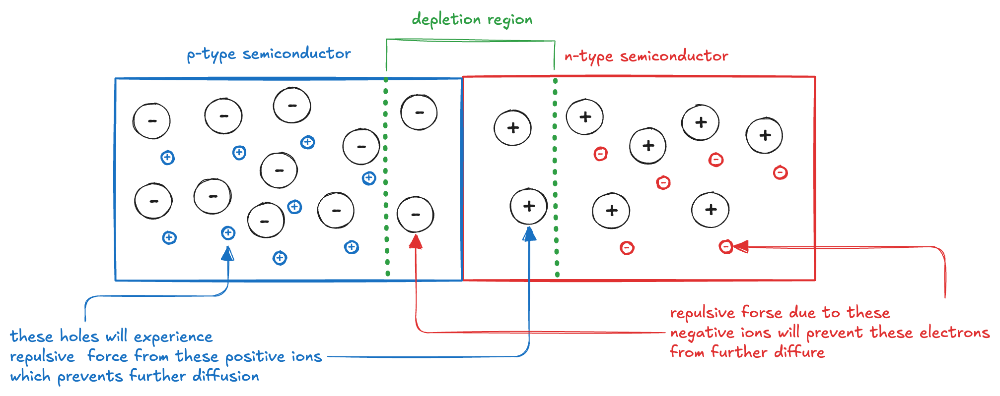

The region around the junction is termed as **depletion region** because the mobile charge carriers (free electrons and holes) have been emptied in this region. When an **external voltage** is applied to a p–n junction such that the **p-side is made positive relative to the n-side (forward bias)**, the applied field works against the built-in potential of the depletion region. As the applied voltage approaches the built-in potential (about 0.7 V for silicon), the barrier is reduced and the depletion region narrows. This allows holes in the p-side to be pushed toward the junction, while electrons in the n-side are also driven toward the junction. When these carriers meet at the boundary, electrons recombine with holes, effectively neutralizing one another. However, the external voltage source continually supplies new carriers: more electrons are injected from the n-side, and more holes are injected from the p-side. This **continuous injection and recombination process sustains a steady current flow** across the junction. The applied voltage maintains the supply of carriers that replace those recombined at the interface, so the current persists as long as the forward bias is applied:

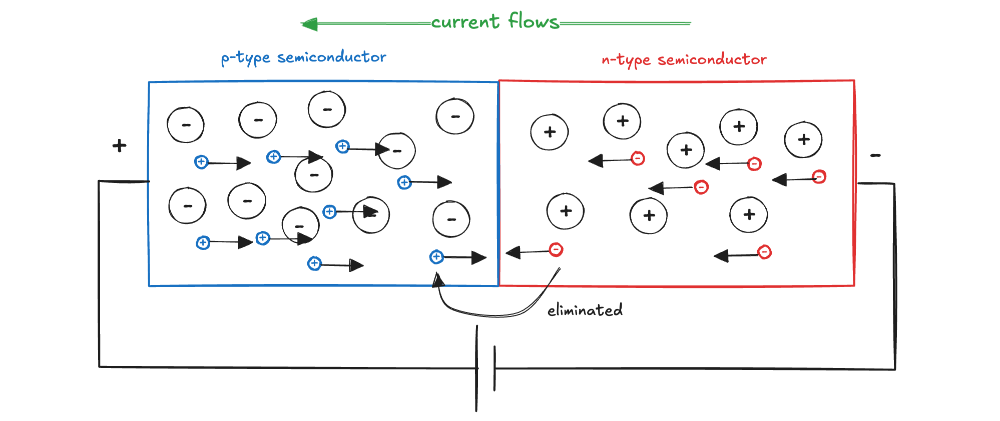

When an external voltage is applied to a p–n junction such that the **p-side is made negative relative to the n-side (reverse bias)**, the applied field acts in the same direction as the built-in potential of the depletion region. As a result, the depletion region widens, and the barrier potential increases. Under these conditions, the majority carriers (holes in the p-side and electrons in the n-side) are pulled away from the junction, preventing them from crossing. This effectively blocks current flow. If the reverse bias is increased beyond a critical value, called the **breakdown voltage**, the junction can suddenly conduct a large current.

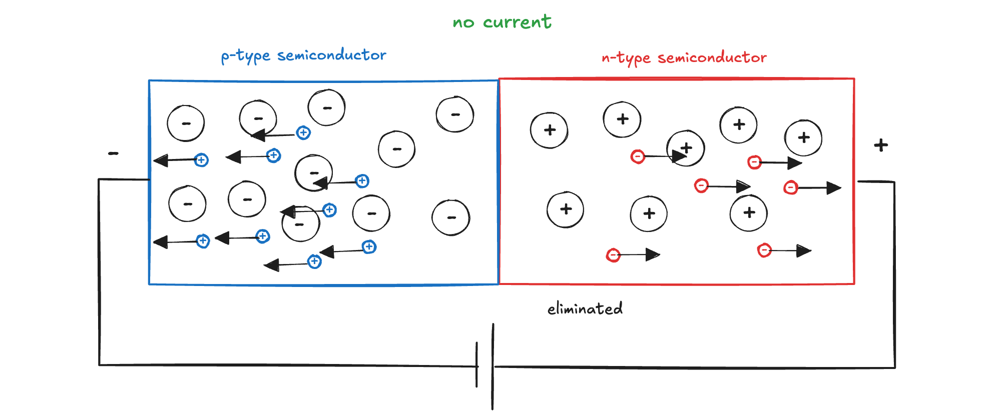

### Diode

A **diode** is essentially a junction provided with two external terminals: 
- the **anode**, connected to the p-type region
- the **cathode**, connected to the n-type region. 

Encapsulating the junction in a practical component with external contacts allows engineers to exploit its properties in real circuits. In circuit diagrams the diode is represented by a triangle pointing toward a vertical bar: the triangle corresponds to the anode (p-side) and the bar to the cathode (n-side): 

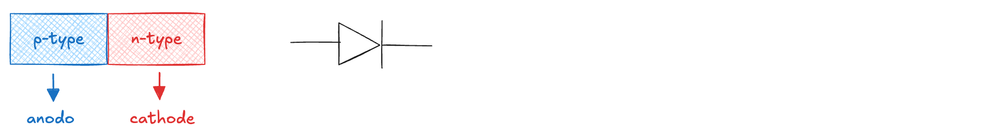

It behaves as a **one-way valve for current**. When the anode is made positive with respect to the cathode, the applied voltage counteracts the built-in potential, the depletion region narrows, and majority carriers are able to cross the junction. Once the applied voltage exceeds a certain threshold (about 0.7V in silicon) current flows readily. In the opposite condition, when the anode is negative relative to the cathode, the applied voltage reinforces the barrier potential, the depletion region widens, and majority carriers are repelled. In this case the diode blocks current.
The behavior of a diode can be fully understood by looking at its **current–voltage (I–V) characteristic**:

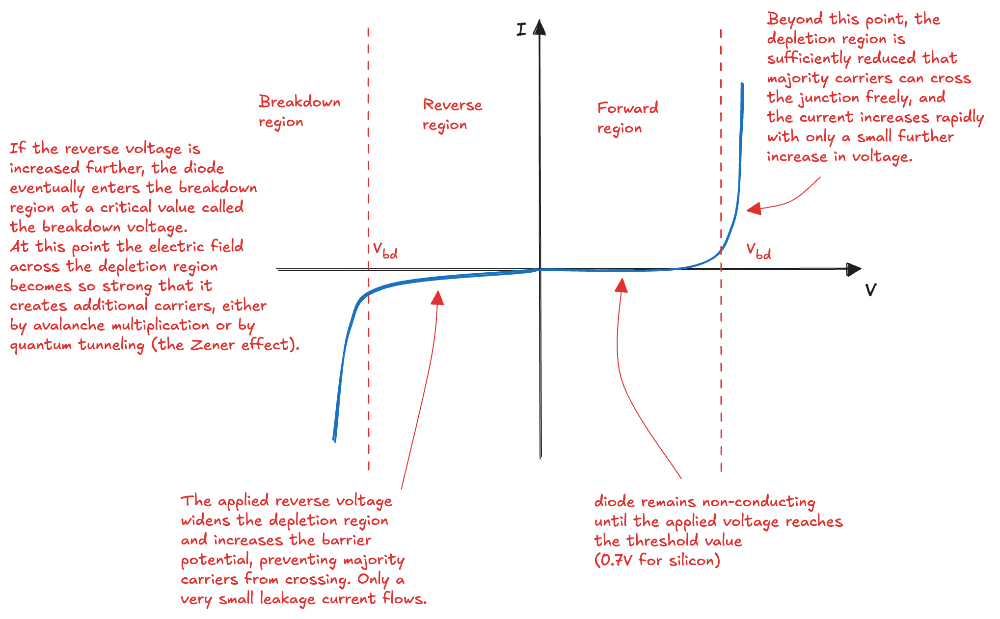

Although simple, the diode plays an essential role in electronics. Its unidirectional conduction property is exploited in rectifiers that convert AC into DC, in clamping and protection circuits, in demodulation of signals, and in voltage regulation when operated in breakdown mode (Zener diode). From this elementary device, the foundation was laid for more complex components such as transistors and integrated circuits, but even today the diode remains one of the most indispensable elements in modern circuits.

### MOS Transistor

To understand how digital circuits work, we need to examine the **MOSFET (Metal–Oxide–Semiconductor Field-Effect Transistor)**, the most widely used electronic device: every logic gate, memory cell, and microprocessor is ultimately made from billions of MOS transistors. At its core, it is a controllable switch built on a piece of silicon. Imagine starting with a block of semiconductor (the **substrate**). Two regions within this substrate are **heavily doped** to provide a high density of charge carriers. This basic principle comes in two complementary forms:
- **nMOS**: the substrate is p-type, and the two doped regions are n-type, providing free electrons as carriers
- **pMOS**: the substrate is n-type, and the two doped regions are p-type, providing holes as carriers.

These two regions will later serve as the ends of the switch, one acting as the **entry point for carriers** (the **source**) and the other **as the exit point** (the **drain**). Above the space between source and drain lies a thin **insulating layer** of silicon dioxide, and on top of it a **conductive plate** called the **gate**. The gate does not touch the silicon directly; instead, it influences it through an electric field. By applying a voltage to the gate, we can decide whether or not carriers are allowed to flow between source and drain:

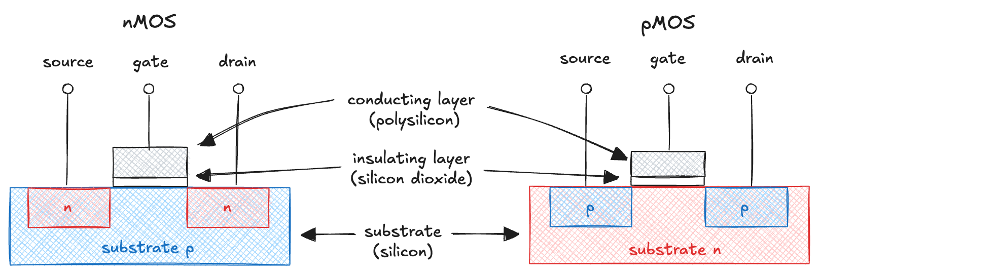

The MOS transistor works **like a switch** controlled by voltage rather than by mechanical movement. When the gate voltage is low, no conductive path exists, and the switch is OFF. When the gate voltage exceeds a certain threshold, it creates a **channel** in the silicon beneath, allowing current to flow freely from source to drain, the switch is ON. In order to understand this behavior, we can consider the nMOS device: 

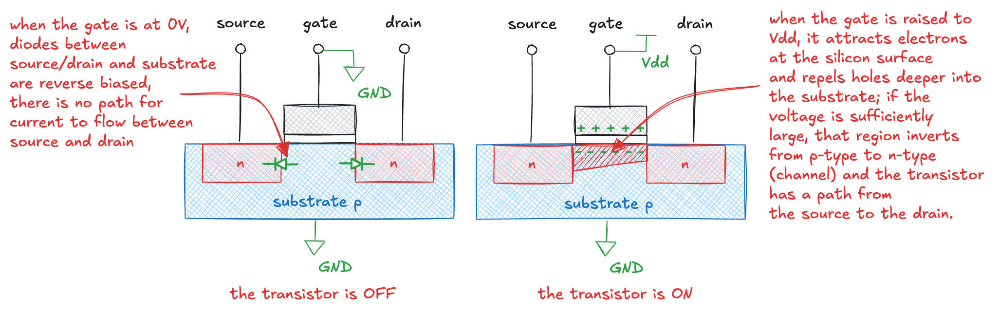

When the gate voltage is zero, the p–n junctions between the n-type source/drain and the p-type substrate are reverse biased (since source/drain never goes below the minimum potential). Under these conditions, there is no conductive path between source and drain, and no current can flow through the device. When a positive voltage is applied to the gate relative to the substrate, the electric field created by the gate penetrates through the oxide into the semiconductor. This field repels the holes in the substrate and attracts electrons toward the surface just under the gate. As the gate voltage increases, more electrons accumulate and when the voltage reaches a critical value (**threshold voltage**), the concentration of electrons becomes high enough to invert the conductivity of the region under the gate. The surface of the substrate, originally p-type, is transformed into a thin n-type **channel** that connects the source and the drain. With this inversion layer in place, electrons can now flow from the source to the drain, when a voltage is applied between them. The transistor provides a conductive path controlled entirely by the gate voltage.

The pMOS transistor is the **complementary** counterpart of the nMOS. The substrate is connected to the supply voltage. When the gate–substrate voltage is zero (that is, when the gate is also at the supply voltage), the p–n junctions between the source/drain and the substrate are reverse biased. No channel exists under the gate, and the transistor is OFF. If the gate is brought down toward 0V, the gate–substrate voltage becomes negative. The electric field repels electrons from the surface of the substrate and attracts holes. Once the gate–substrate voltage goes below the threshold voltage, the surface inverts from n-type to p-type, forming a conductive channel that connects source and drain. With this inversion layer in place, holes can flow across the device, and the transistor turns ON.

Summarizing:
- in an nMOS, a positive gate voltage induces an n-type channel for electrons
- in a pMOS, a zero gate voltage induces a p-type channel for holes

The nMOS and pMOS transistors are represent them with simple symbols that indicate their type and connections. Both symbols have three terminals: the gate (control input), the drain (where current leaves), and the source (where current enters). The substrate is tied to ground for nMOS and to power supply for pMOS, and is omitted from the symbol for simplicity:

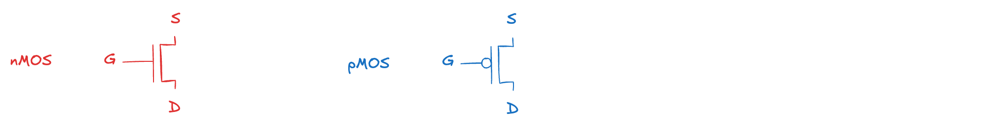

### The switch model

From the perspective of digital design, a MOS transistor can be understood as a **voltage-controlled switch**. The gate voltage determines whether a conductive path exists between the source and the drain. For an nMOS transistor, the switch is OFF when the gate is at logic 0 (0V), and it turns ON when the gate is at logic 1 (power supply). In other words, an **nMOS conducts when its gate is high**. For a pMOS transistor, the behavior is the opposite. The switch is ON when the gate is at logic 0, and OFF when the gate is at logic 1. A **pMOS conducts when its gate is low**:

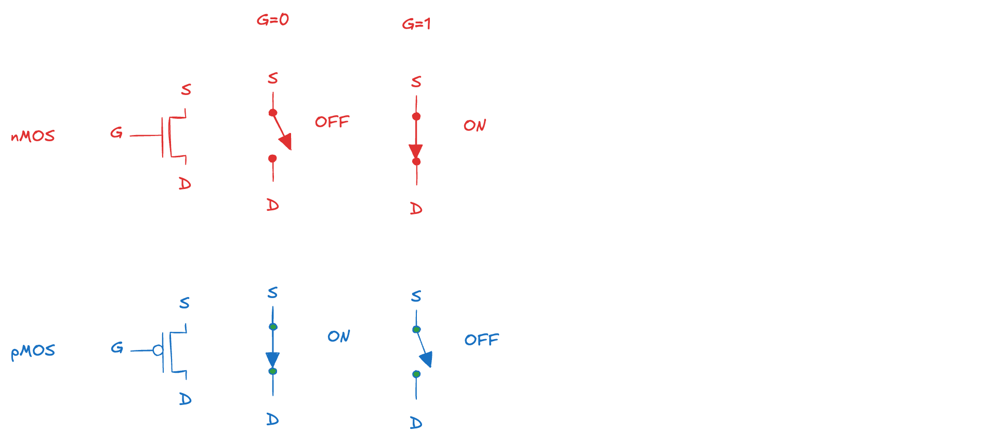

Although MOS transistors can be modeled as switches, they are **not perfect switches**. An nMOS transistor turns on when its gate is at supply voltage. If the source is at 0V, it easily pulls the drain node down to 0, because the gate is still much higher than the substrate and the channel is strong. In this case, the **nMOS "passes" a logic 0 very well**. But if the source is at supply voltage and the drain is supposed to rise toward supply voltage, the situation changes. As the drain node approaches the gate voltage, the electric field under the gate weakens, the inversion layer disappears, and the output stalls below the full supply voltage. An **nMOS cannot pass a strong 1**. The behavior of a pMOS is the exact complement. With its substrate tied to supply voltage, it turns on when the gate is low. If the source is at supply voltage, the pMOS can pull the drain node cleanly up to the supply voltage, because the gate–substrate field is strongly negative and the channel is robust. It therefore **passes a logic 1 well**. But if the source is at 0, the drain node cannot be pulled all the way to ground. As the node approaches 0, the gate and the channel are at the same potential, the inversion layer fades, and the output stalls above 0. A **pMOS cannot pass a strong 0**. The intuition is simple: 
- nMOS transistors act like **strong switches to ground** but **weak switches to high**
- pMOS transistors act like **strong switches to high** but **weak switches to ground**. 

### CMOS

To build digital logic efficiently, **both nMOS and pMOS transistors must be fabricated on the same chip**. The challenge is that each type of transistor requires a different substrate: nMOS devices need a p-type substrate, while pMOS devices need an n-type substrate. The solution is the **n-well process**. Modern manufacturing starts with a p-type wafer, which directly supports nMOS fabrication, and then implants localized n-type regions, called **wells**, into which pMOS transistors are built. This makes it possible to integrate both types of transistors side by side on a single piece of silicon:

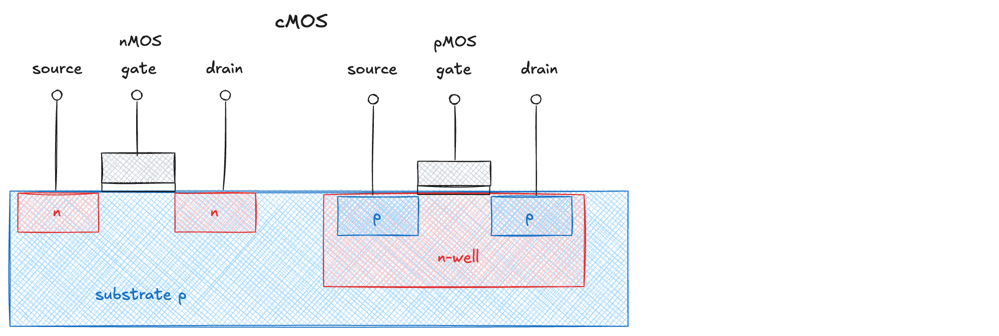

This approach is known as **complementary MOS**, or **CMOS**, and it has become the dominant technology for digital electronics. In CMOS circuits, nMOS and pMOS transistors work together to implement logic functions. The nMOS devices provide a strong connection to ground, ensuring that outputs can be pulled fully to 0, while the pMOS devices provide a strong connection to the supply voltage, ensuring that outputs can be pulled fully to high}. In this way, CMOS gates overcome the weaknesses of using only one type of device.

### Building Integrated Circuits

Modern integrated circuits are fabricated on thin, flat slices of silicon known as **wafers**. These wafers are cut from large, single-crystal ingots of silicon and polished to extreme smoothness. Today’s production wafers typically have a diameter of about 30 cm, allowing thousands of individual circuits to be manufactured at once on a single piece of silicon:

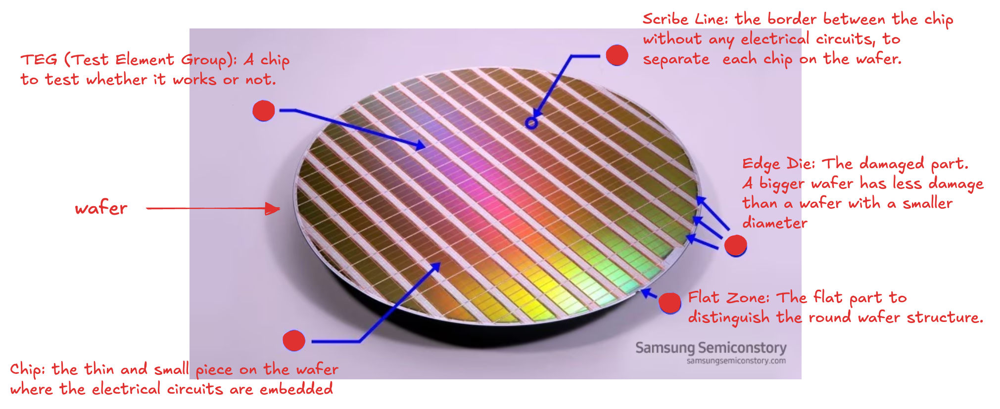

On the surface of the wafer, advanced manufacturing processes create microscopic transistors by layering and patterning materials with **nanometer precision**. Each transistor is only a fraction of a micron in length, which makes it possible to fabricate billions of them at a time at relatively low cost. The ability to manufacture so many devices simultaneously is one of the main reasons why integrated circuits have become so inexpensive and widespread.

Once all the devices and interconnections have been built into the wafer, the wafer is cut into small rectangular sections called **chips** or **dies**. Each chip contains a complete electronic circuit, which may consist of thousands, millions, or even billions of transistors depending on its complexity. These chips are then packaged and tested before being assembled into computers, smartphones, and countless other electronic systems.

Because the features on a modern wafer are so small, even a single dust particle or strand of hair can destroy or degrade a circuit. For this reason, wafers are manufactured in **clean rooms**, highly controlled environments where the air is constantly filtered to remove contaminants. Technicians wear special "**bunny suits**" that cover their entire body, preventing particles from their hair, skin, or clothing from contaminating the wafers:

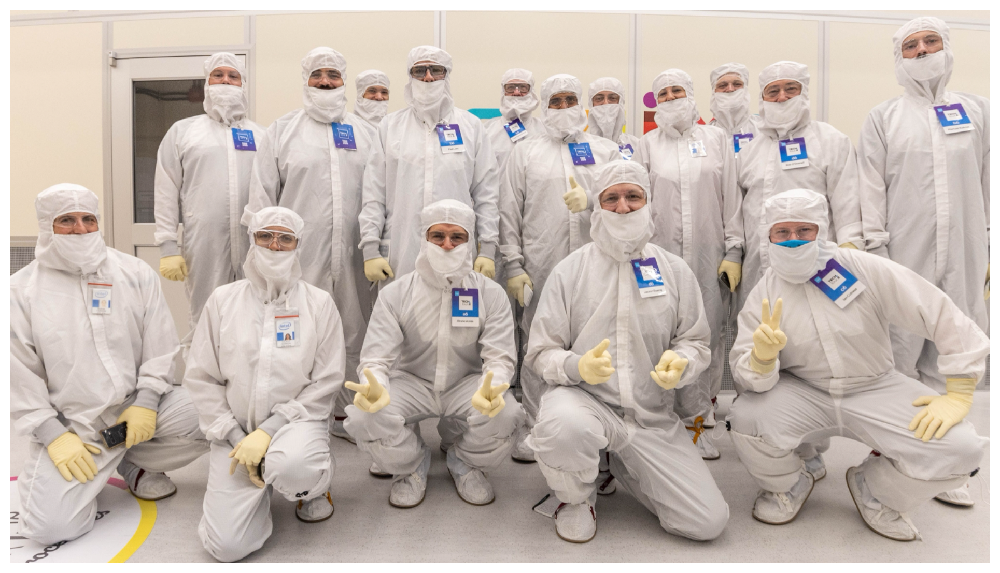

The combination of large wafer sizes, microscopic feature dimensions, and clean-room manufacturing enables the production of integrated circuits at the scale required by today’s digital world. From each wafer emerge hundreds or thousands of chips, each capable of performing billions of operations per second, forming the foundation of all modern electronics.

## CMOS logic gates

The true power of CMOS technology emerges when we combine nMOS and pMOS transistors to build logic gates. The basic idea is simple, by arranging nMOS and pMOS networks in a complementary way, we can construct any logic gate that produces full logic levels with very low static power consumption.

### NOT Gate (Inverter)

The simplest CMOS circuit is the inverter. It consists of a pMOS at the top, connected to power supply, and an nMOS at the bottom, connected to ground, connected  together to form the output:

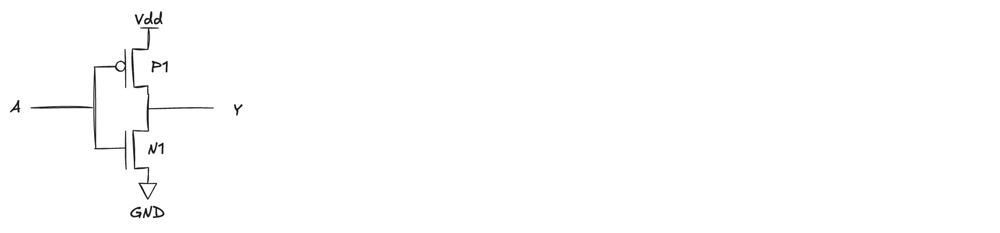

- if the input A=0, the nMOS is OFF and the pMOS is ON, so the output is connected to power supply and pulled up to logic 1
- if A=1, the nMOS is ON and the pMOS is OFF, so the output is connected to ground and pulled down to logic 0

This complementary action guarantees that the inverter always produces the opposite logic value of its input.

### NAND Gate

The NAND gate can be constructed by connecting two nMOS transistors in series and two pMOS transistors in parallel:

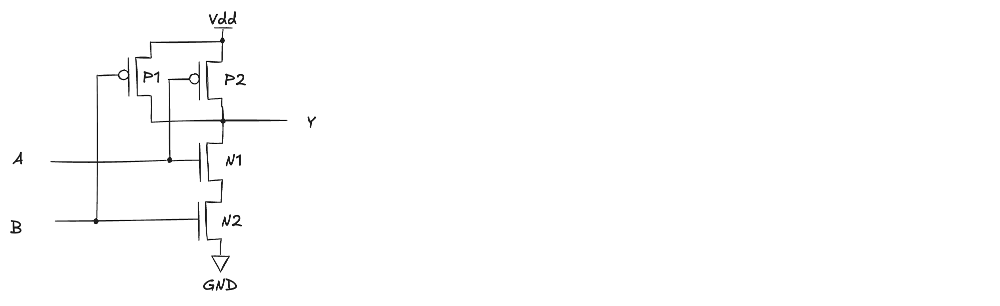

- if both inputs A and B are 1, the two nMOS transistors conduct, creating a path to ground that pulls the output to 0
- in all other cases, at least one of the pMOS transistors is ON, which connects the output to power supply, making it 1 

Thus, the output is 0 only when both inputs are 1, which is exactly the NAND function.

### NOR Gate

The NOR gate is built as the dual of the NAND. Here, the nMOS transistors are in parallel and the pMOS transistors are in series: 

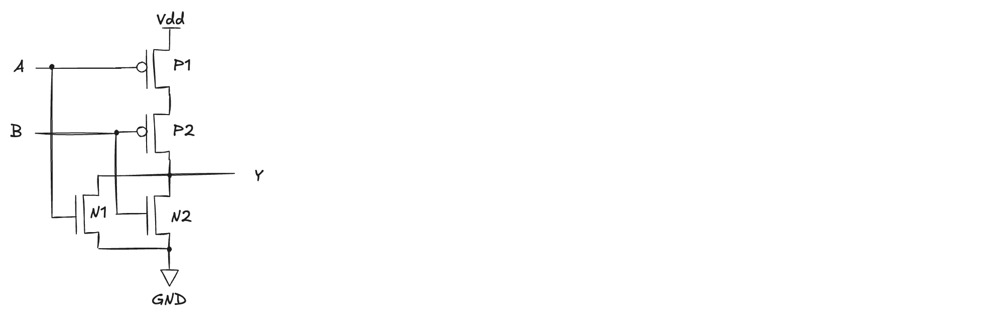

- if either input is 1, one of the nMOS devices conducts, connecting the output to ground and producing a 0
- only when both inputs are 0 do the pMOS transistors conduct together, pulling the output up to 1. 

This behavior corresponds to the NOR function. 

### General Rule for Inverting Logic

From the examples of the inverter, NAND, and NOR, we can **generalize the structure of CMOS logic**. Every gate consists of two complementary parts: a **pMOS pull-up network** that connects the output to power supply, and an **nMOS pull-down network** that connects the output to ground. The input signals are applied to both networks in such a way that exactly one of them conducts in any stable state: 

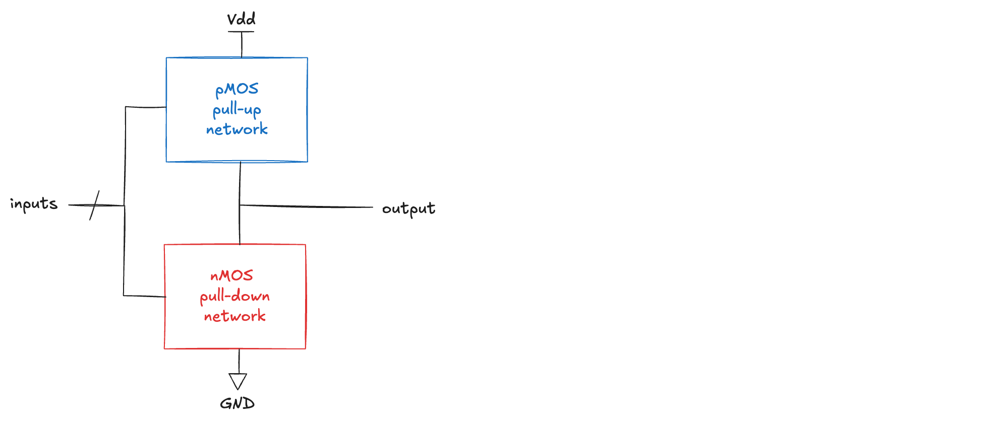

- if the pull-down network is ON, the output is discharged to 0
- if the pull-up network is ON, the output is charged to 1

The arrangement of transistors inside each network follows a simple rule. In the nMOS pull-down network, transistors placed in parallel mean the output is pulled down if any input is 1, while transistors in series mean the output is pulled down only if all inputs are 1. The pMOS pull-up network is always built as the logical complement: series in the nMOS network corresponds to parallel in the pMOS network, and parallel in the nMOS network corresponds to series in the pMOS network.

This complementary organization guarantees correct logic behavior and ensures that there is never a direct conducting path between power supply and ground when the output is stable. It is this property that gives CMOS logic its extremely low static power consumption.

Among the basic logic functions, the **NAND and NOR gate is particularly simple and efficient to implement in CMOS**. Their compact configuration requires only four transistors. Historically, this simplicity had major consequences. In early integrated circuit families such as TTL (Transistor-Transistor Logic) and later CMOS, engineers quickly realized that implementing AND or OR directly was more complex and required extra transistors. NAND and NOR, on the other hand, were much cheaper in terms of transistor count and area on the silicon wafer. For this reason, libraries of logic gates in early ICs were based primarily on NAND and NOR. This tradition persists: even today, synthesis tools for digital circuits often map logic into networks of NAND or NOR gates, since these are the most efficient primitives in CMOS.

### Transmission Gate

We have seen that nMOS and pMOS transistors, when used individually as switches, are not perfect: nMOS passes logic 0 well but fails to pass a strong 1, while pMOS passes logic 1 well but fails to pass a strong 0. In order to have a good switch in every situation, we can combine them in parallel, so that each device handles the logic level it is best at. This arrangement is known as a **CMOS transmission gate**:

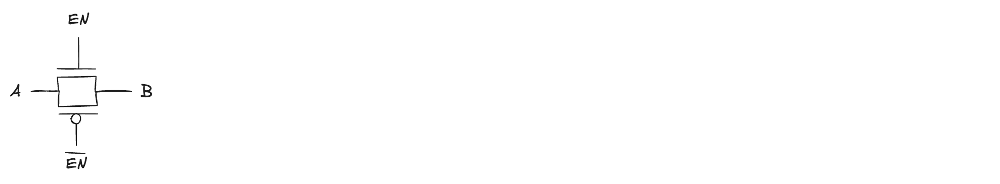

A transmission gate consists of one nMOS and one pMOS connected in parallel between two nodes, say A and B. The gates of the two transistors are driven by **complementary enable signals**: the nMOS gate receives EN, while the pMOS gate receives the inverted signal:
- when EN=0, both transistors are OFF. In this case, there is no conducting path between A and B, so the transmission gate is open and the two nodes are electrically disconnected.
- when EN=1, both transistors are ON. Now the nMOS provides a strong connection for logic 0, and the pMOS provides a strong connection for logic 1. 

As a result, any logic value can pass cleanly from A to B or from B to A. The transmission gate behaves like an almost ideal bidirectional switch. It is often used to implement circuits where an ideal switch is needed.

## Power consumption

Every electronic system **consumes power**, which is the **amount of energy used per unit time**. In portable devices, this directly impacts **battery life**, while in plugged systems it determines electricity costs, heat dissipation, and environmental impact.

A typical smartphone battery stores about 10 watt-hours (Wh) of energy. This means it can supply 1 watt of power for 10 hours, or 2 watts for 5 hours, and so forth. To last a full day on a single charge, the average power consumption of a smartphone must therefore remain under about 1 watt. Laptops typically have larger batteries, in the range of 50 to 100 WWh, and during normal operation consume less than 10 watts, much of which is used by the display.

Power consumption is also important for systems that are continuously plugged into the grid. Drawing more power increases electricity costs and contributes to greenhouse gas emissions. Furthermore, excessive power use generates heat, and if a system cannot dissipate this heat efficiently, it risks overheating and damaging components.

Digital systems consume two kinds of power: **dynamic power** and **static power**. Dynamic power is used when signals change value, as charging and discharging capacitances requires energy every time a node switches between 0 and 1. Static power, on the other hand, is consumed even when the system is idle and no signals are switching. Static consumption arises from leakage currents inside transistors, which become more significant as devices scale down to nanometer dimensions.

Modern chip designers must carefully manage both forms of power. Dynamic power dominates in active circuits, while static power becomes a critical issue for idle states and standby modes. The balance between performance, battery life, and thermal limits makes power consumption one of the central challenges of digital design.